In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplot inline
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_modelc import LinearRegression

UsageError: Line magic function `%matplot` not found.


In [2]:
taxi_df = pd.read_csv("taxifare.csv")

In [3]:
taxi_df.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
0,26:21.0,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1
1,52:16.0,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1
2,35:00.0,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2
3,30:42.0,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1
4,51:00.0,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1


In [4]:
taxi_df.shape

(50000, 8)

In [5]:
taxi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   unique_id             50000 non-null  object 
 1   amount                50000 non-null  float64
 2   date_time_of_pickup   50000 non-null  object 
 3   longitude_of_pickup   50000 non-null  float64
 4   latitude_of_pickup    50000 non-null  float64
 5   longitude_of_dropoff  50000 non-null  float64
 6   latitude_of_dropoff   50000 non-null  float64
 7   no_of_passenger       50000 non-null  int64  
dtypes: float64(5), int64(1), object(2)
memory usage: 3.1+ MB


In [6]:
import datetime

In [7]:
pd.to_datetime(taxi_df['date_time_of_pickup'])

0       2009-06-15 17:26:21+00:00
1       2010-01-05 16:52:16+00:00
2       2011-08-18 00:35:00+00:00
3       2012-04-21 04:30:42+00:00
4       2010-03-09 07:51:00+00:00
                   ...           
49995   2013-06-12 23:25:15+00:00
49996   2015-06-22 17:19:18+00:00
49997   2011-01-30 04:53:00+00:00
49998   2012-11-06 07:09:00+00:00
49999   2010-01-13 08:13:14+00:00
Name: date_time_of_pickup, Length: 50000, dtype: datetime64[ns, UTC]

In [8]:
taxi_df['date_time_of_pickup']=pd.to_datetime(taxi_df['date_time_of_pickup'])-datetime.timedelta(hours=4)

In [9]:
taxi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   unique_id             50000 non-null  object             
 1   amount                50000 non-null  float64            
 2   date_time_of_pickup   50000 non-null  datetime64[ns, UTC]
 3   longitude_of_pickup   50000 non-null  float64            
 4   latitude_of_pickup    50000 non-null  float64            
 5   longitude_of_dropoff  50000 non-null  float64            
 6   latitude_of_dropoff   50000 non-null  float64            
 7   no_of_passenger       50000 non-null  int64              
dtypes: datetime64[ns, UTC](1), float64(5), int64(1), object(1)
memory usage: 3.1+ MB


In [10]:
taxi_df.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
0,26:21.0,4.5,2009-06-15 13:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1
1,52:16.0,16.9,2010-01-05 12:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1
2,35:00.0,5.7,2011-08-17 20:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2
3,30:42.0,7.7,2012-04-21 00:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1
4,51:00.0,5.3,2010-03-09 03:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1


In [11]:
taxi_df['date_time_of_pickup'].dt.month

0         6
1         1
2         8
3         4
4         3
         ..
49995     6
49996     6
49997     1
49998    11
49999     1
Name: date_time_of_pickup, Length: 50000, dtype: int64

In [12]:
taxi_df['year']=taxi_df['date_time_of_pickup'].dt.year
taxi_df['month']=taxi_df['date_time_of_pickup'].dt.month
taxi_df['day']=taxi_df['date_time_of_pickup'].dt.day
taxi_df['hours']=taxi_df['date_time_of_pickup'].dt.hour
taxi_df['minutes']=taxi_df['date_time_of_pickup'].dt.minute

In [13]:
taxi_df.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,year,month,day,hours,minutes
0,26:21.0,4.5,2009-06-15 13:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,13,26
1,52:16.0,16.9,2010-01-05 12:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,5,12,52
2,35:00.0,5.7,2011-08-17 20:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2,2011,8,17,20,35
3,30:42.0,7.7,2012-04-21 00:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,0,30
4,51:00.0,5.3,2010-03-09 03:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1,2010,3,9,3,51


In [14]:
import numpy as np

In [15]:
taxi_df['mornight']=np.where(taxi_df['hours']<12,0,1)

In [16]:
taxi_df.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,year,month,day,hours,minutes,mornight
0,26:21.0,4.5,2009-06-15 13:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,13,26,1
1,52:16.0,16.9,2010-01-05 12:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,5,12,52,1
2,35:00.0,5.7,2011-08-17 20:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2,2011,8,17,20,35,1
3,30:42.0,7.7,2012-04-21 00:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,0,30,0
4,51:00.0,5.3,2010-03-09 03:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1,2010,3,9,3,51,0


In [17]:
taxi_df.drop('date_time_of_pickup',axis=1,inplace=True)

In [18]:
taxi_df.head()

,unique_id,amount,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,year,month,day,hours,minutes,mornight
0,26:21.0,4.5,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,13,26,1
1,52:16.0,16.9,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,5,12,52,1
2,35:00.0,5.7,-73.982738,40.761270,-73.991242,40.750562,2,2011,8,17,20,35,1
3,30:42.0,7.7,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,0,30,0
4,51:00.0,5.3,-73.968095,40.768008,-73.956655,40.783762,1,2010,3,9,3,51,0


In [19]:
taxi_df['unique_id'].unique()

array(['26:21.0', '52:16.0', '35:00.0', ..., '38:13.0', '04:12.0',
       '53:22.0'], dtype=object)

In [20]:
taxi_df.drop("unique_id",axis=1,inplace = True)

In [21]:
from sklearn.metrics.pairwise import haversine_distances
from math import radians
newdelhi = [28.6139, 77.2090]
banglore = [12.9716, 77.5946]

In [22]:
newdelhi_in_radians = [radians(_) for _ in newdelhi]
banglore_in_radians = [radians(_) for _ in banglore]


In [23]:
result = haversine_distances([newdelhi_in_radians, banglore_in_radians])

In [24]:
result*6371

array([[   0.       , 1739.8021019],
       [1739.8021019,    0.       ]])

In [25]:
np.radians(taxi_df['latitude_of_dropoff']-taxi_df['latitude_of_pickup'])

0       -0.000158
1        0.001234
2       -0.000187
3        0.000435
4        0.000275
           ...   
49995   -0.000742
49996   -0.000133
49997    0.000350
49998    0.000037
49999    0.000000
Length: 50000, dtype: float64

In [26]:
def haversine(df):
    lat1= np.radians(taxi_df["latitude_of_pickup"])
    lat2= np.radians(taxi_df["latitude_of_dropoff"])
    dlat = np.radians(taxi_df['latitude_of_dropoff']-taxi_df['latitude_of_pickup'])
    dlong = np.radians(taxi_df['longitude_of_dropoff']-taxi_df['longitude_of_pickup'])
    a = np.sin(dlat/2)**2+np.cos(lat1)*np.cos(lat2)*np.sin(dlong/2)**2
    c = 2*np.arctan2(np.sqrt(a),np.sqrt(1-a))
    r = 6371
    return c*r

In [27]:
taxi_df['total distance']=haversine(taxi_df)

In [28]:
taxi_df.head()

,amount,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,year,month,day,hours,minutes,mornight,total distance
0,4.5,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,13,26,1,1.030764
1,16.9,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,5,12,52,1,8.450134
2,5.7,-73.982738,40.761270,-73.991242,40.750562,2,2011,8,17,20,35,1,1.389525
3,7.7,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,0,30,0,2.799270
4,5.3,-73.968095,40.768008,-73.956655,40.783762,1,2010,3,9,3,51,0,1.999157


In [29]:
import json
records = json.loads(taxi_df.T.to_json()).values()

In [30]:
!pip install pymongo

In [31]:
import pymongo
client = pymongo.MongoClient('mongodb://localhost:27017/')
db=client['newyorktaxi']
col=db["rides"]

In [32]:
records

dict_values([{'amount': 4.5, 'longitude_of_pickup': -73.844311, 'latitude_of_pickup': 40.721319, 'longitude_of_dropoff': -73.84161, 'latitude_of_dropoff': 40.712278, 'no_of_passenger': 1.0, 'year': 2009.0, 'month': 6.0, 'day': 15.0, 'hours': 13.0, 'minutes': 26.0, 'mornight': 1.0, 'total distance': 1.030763935}, {'amount': 16.9, 'longitude_of_pickup': -74.016048, 'latitude_of_pickup': 40.711303, 'longitude_of_dropoff': -73.979268, 'latitude_of_dropoff': 40.782004, 'no_of_passenger': 1.0, 'year': 2010.0, 'month': 1.0, 'day': 5.0, 'hours': 12.0, 'minutes': 52.0, 'mornight': 1.0, 'total distance': 8.4501335958}, {'amount': 5.7, 'longitude_of_pickup': -73.982738, 'latitude_of_pickup': 40.76127, 'longitude_of_dropoff': -73.991242, 'latitude_of_dropoff': 40.750562, 'no_of_passenger': 2.0, 'year': 2011.0, 'month': 8.0, 'day': 17.0, 'hours': 20.0, 'minutes': 35.0, 'mornight': 1.0, 'total distance': 1.3895252258}, {'amount': 7.7, 'longitude_of_pickup': -73.98713, 'latitude_of_pickup': 40.733143

In [33]:
col.insert_many(records)

ServerSelectionTimeoutError: localhost:27017: [WinError 10061] No connection could be made because the target machine actively refused it, Timeout: 30s, Topology Description: <TopologyDescription id: 649d3c34dc4c731a8cd9c04c, topology_type: Unknown, servers: [<ServerDescription ('localhost', 27017) server_type: Unknown, rtt: None, error=AutoReconnect('localhost:27017: [WinError 10061] No connection could be made because the target machine actively refused it')>]>

In [34]:
taxi_df.head()

,amount,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,year,month,day,hours,minutes,mornight,total distance
0,4.5,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,13,26,1,1.030764
1,16.9,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,5,12,52,1,8.450134
2,5.7,-73.982738,40.761270,-73.991242,40.750562,2,2011,8,17,20,35,1,1.389525
3,7.7,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,0,30,0,2.799270
4,5.3,-73.968095,40.768008,-73.956655,40.783762,1,2010,3,9,3,51,0,1.999157


In [35]:
taxi_df.to_csv('final_data.csv')

In [36]:
x=taxi_df.iloc[:,1:]
y=taxi_df.iloc[:,0]

In [37]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(x,y)

ExtraTreesRegressor()

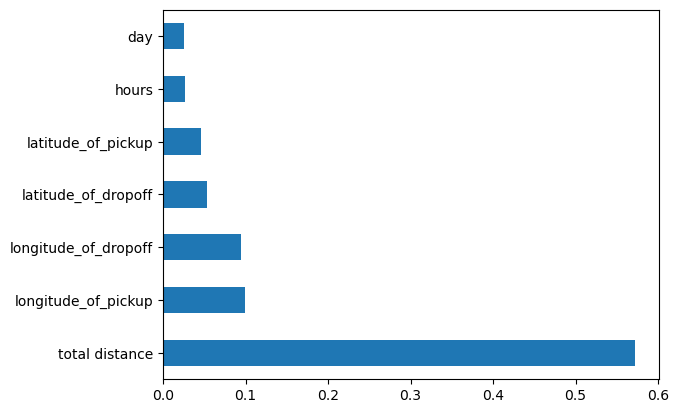

In [38]:
feat_importances = pd.Series(model.feature_importances_, index=x.columns)
feat_importances.nlargest(7).plot(kind='barh')
plt.show()

In [39]:
x.head()

,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,year,month,day,hours,minutes,mornight,total distance
0,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,13,26,1,1.030764
1,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,5,12,52,1,8.450134
2,-73.982738,40.761270,-73.991242,40.750562,2,2011,8,17,20,35,1,1.389525
3,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,0,30,0,2.799270
4,-73.968095,40.768008,-73.956655,40.783762,1,2010,3,9,3,51,0,1.999157


In [40]:
y.head()

0     4.5
1    16.9
2     5.7
3     7.7
4     5.3
Name: amount, dtype: float64

In [41]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=100)

In [42]:
!pip install xgboost

In [43]:
import xgboost

In [44]:
regressor=xgboost.XGBRegressor()
regressor.fit(x_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [45]:
y_pred=regressor.predict(x_test)

In [46]:
import matplotlib.pyplot as plt
%matplotlib inline

C:\Users\War machine\AppData\Local\Temp\ipykernel_12356\963874834.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test-y_pred)


<Axes: xlabel='amount', ylabel='Density'>

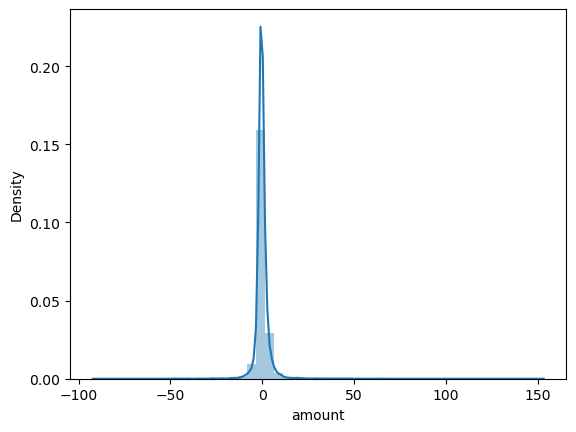

In [47]:
import seaborn as sns
sns.distplot(y_test-y_pred)

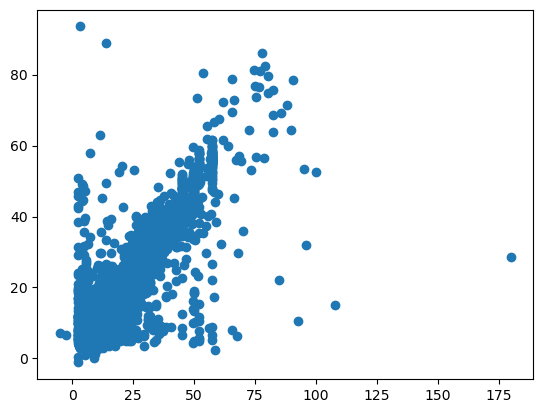

In [48]:
plt.scatter(y_test,y_pred)

In [49]:
from sklearn import metrics
print('R square:',np.sqrt(metrics.r2_score(y_test,y_pred)))
print('MAE:',metrics.mean_absolute_error(y_test,y_pred))
print('MSE:',metrics.mean_squared_error(y_test,y_pred))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_pred)))

R square: 0.882328612483104
MAE: 2.0201336780971286
MSE: 20.577955463085154
RMSE: 4.536293141220611


In [50]:
from sklearn.model_selection import RandomizedSearchCV

In [51]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
print(n_estimators)

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]


In [52]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
learning_rate = ['0.05','0.1','0.2','0.3','0.5','0.6']
max_depth = [int(x) for x in np.linspace(5,30,num = 6)]
subsample = [0.7,0.6,0.8]
min_child_weight=[3,4,5,6,7]

In [53]:
random_grid = {'n_estimators':n_estimators,
              'learning_depth':learning_rate,
              'max_depth':max_depth,
              'subsample':subsample,
              'min_child_weight':min_child_weight}
print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'learning_depth': ['0.05', '0.1', '0.2', '0.3', '0.5', '0.6'], 'max_depth': [5, 10, 15, 20, 25, 30], 'subsample': [0.7, 0.6, 0.8], 'min_child_weight': [3, 4, 5, 6, 7]}


In [54]:
regressor = xgboost.XGBRegressor()

In [55]:
xg_random = RandomizedSearchCV(estimator = regressor,param_distributions = random_grid,scoring='neg_mean_squared_error')

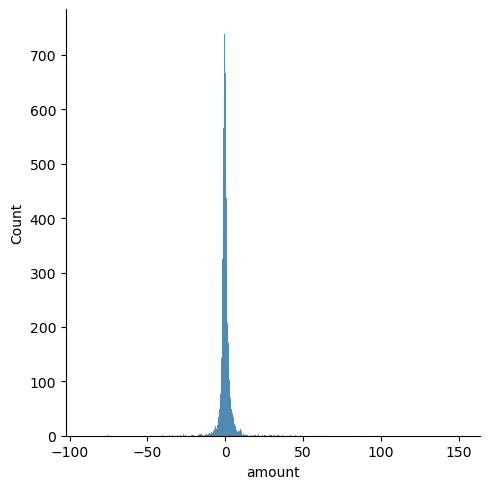

In [56]:
sns.displot(y_test-y_pred)

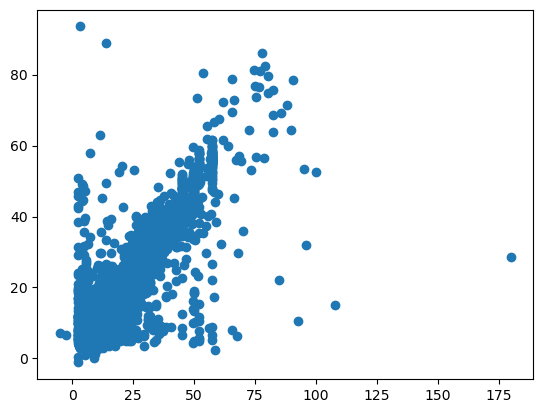

In [57]:
plt.scatter(y_test,y_pred)

In [58]:
x_train.head()

,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,year,month,day,hours,minutes,mornight,total distance
48824,-73.993933,40.746288,-74.006453,40.735673,2,2009,9,15,15,55,1,1.582966
2704,-74.011608,40.714802,-74.008608,40.704201,1,2012,7,20,5,26,0,1.205594
25631,-73.957537,40.770983,-73.979354,40.766529,1,2013,11,6,14,42,1,1.902870
7285,-73.975203,40.765210,-73.967207,40.772193,1,2011,4,28,6,52,0,1.027785
27346,-73.966357,40.761005,-73.927425,40.769735,2,2014,5,14,22,10,1,3.419454


In [59]:
y_train.head()

48824     5.3
2704      6.9
25631    11.5
7285      5.3
27346    12.5
Name: amount, dtype: float64

In [60]:
x_train.shape[1]

12

In [61]:
!pip install tensorflow

In [62]:
import tensorflow.keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LeakyReLU,PReLU,ELU
from tensorflow.keras.layers import Dropout

In [63]:
NN_model = Sequential()
NN_model.add(Dense(128,kernel_initializer='normal',input_dim=x_train.shape[1],activation='relu'))
NN_model.add(Dense(256,kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256,kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256,kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(1,kernel_initializer='normal',activation='linear'))
NN_model.compile(loss='mean_absolute_error',optimizer='adam',metrics=['mean_absolute_error'])
NN_model.summary()
model_histroy=NN_model.fit(x_train,y_train,validation_split=0.33,batch_size=10,epochs=20)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1664      
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dense_3 (Dense)             (None, 256)               65792     
                                                                 
 dense_4 (Dense)             (None, 1)                 257       
                                                                 
Total params: 166,529
Trainable params: 166,529
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
2345/2345 [============================

In [64]:
prediction=NN_model.predict(x_test)

469/469 [==============================] - 1s 1ms/step


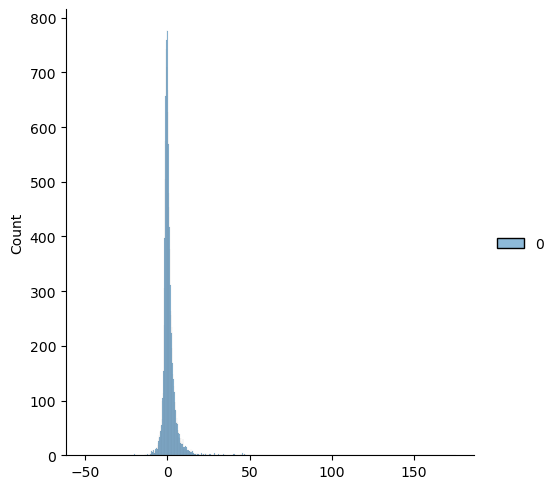

In [65]:
import seaborn as sns 
sns.displot(y_test.values.reshape(-1,1)-prediction)

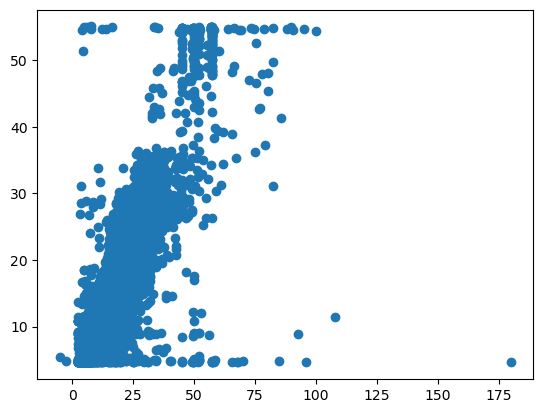

In [66]:
import matplotlib.pyplot as plt
plt.scatter(y_test,prediction)

In [67]:
from sklearn import metrics
print('MAE:',metrics.mean_absolute_error(y_test,prediction))
print('MSE:',metrics.mean_squared_error(y_test,prediction))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,prediction)))

MAE: 2.4348544942003887
MSE: 26.66611091845619
RMSE: 5.163923984573765
